In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import tensorflow as tf
print(tf.__version__)

#tf.config.list_physical_devices('GPU')
#tf.test.is_gpu_available()

import os
os.environ['CUDA_VISIBLE_DEVICES']='0' 

gpu = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(gpu[0], True)


#from tensorflow.python.client import device_lib 
#device_lib.list_local_devices()

2.7.0


In [4]:
import os
import numpy as np
import cv2                 
from random import shuffle
from tqdm import tqdm  
import tensorflow as tf 
from tensorflow.keras import Model
from tensorflow.keras.utils import plot_model
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.callbacks import ReduceLROnPlateau , ModelCheckpoint
from collections import Counter
# Importing the libraries
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.resnet import preprocess_input
from tensorflow.keras.regularizers import l2

from sklearn.metrics import roc_auc_score, confusion_matrix, roc_curve, auc
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
import numpy as np
import seaborn as sn

import matplotlib.pyplot as plt
from itertools import cycle

In [5]:
tf.test.is_gpu_available()

Instructions for updating:
Use `tf.config.list_physical_devices('GPU')` instead.


True

In [6]:
TrianImage="/content/drive/MyDrive/labeled-images/Train"
TestImage="/content/drive/MyDrive/labeled-images/Test"
Barretsimages = os.listdir(TrianImage + "/barretts")
Barretsshortsegmentimages = os.listdir(TrianImage + "/barretts-short-segment")
bbps01mages = os.listdir(TrianImage + "/bbps-0-1")
bbpa23images = os.listdir(TrianImage + "/bbps-2-3")
cecumimages = os.listdir(TrianImage + "/cecum")
dyedliftedpolypsimages = os.listdir(TrianImage + "/dyed-lifted-polyps")
dyedresectionmarginsimages = os.listdir(TrianImage + "/dyed-resection-margins")
esophagatisaimages = os.listdir(TrianImage + "/esophagitis-a")
esophagatisbdimages = os.listdir(TrianImage + "/esophagitis-b-d")
hemorroidsimages = os.listdir(TrianImage + "/hemorrhoids")
ilemimages = os.listdir(TrianImage + "/ileum")
impactestoolimages = os.listdir(TrianImage + "/impacted-stool")
polypsimages = os.listdir(TrianImage + "/polyps")
pylorusimages = os.listdir(TrianImage + "/pylorus")
retroflexrectumimages = os.listdir(TrianImage + "/retroflex-rectum")
retroflexstomachimages = os.listdir(TrianImage + "/retroflex-stomach")
ulcerativclitisgrade01images = os.listdir(TrianImage + "/ulcerative-colitis-grade-0-1")
ulcerativclitisgrade1images = os.listdir(TrianImage + "/ulcerative-colitis-grade-1")
ulcerativclitisgrade_12images = os.listdir(TrianImage + "/ulcerative-colitis-grade-1-2")
ulcerativclitisgrade2images = os.listdir(TrianImage + "/ulcerative-colitis-grade-2")
ulcerativclitisgrade23images = os.listdir(TrianImage + "/ulcerative-colitis-grade-2-3")
ulcerativclitisgrade3images = os.listdir(TrianImage + "/ulcerative-colitis-grade-3")
zlineimages = os.listdir(TrianImage + "/z-line")

In [7]:
print(len(Barretsimages))
print(len(Barretsshortsegmentimages))
print(len(bbps01mages))
print(len(bbpa23images))
print(len(cecumimages))
print(len(dyedliftedpolypsimages))
print(len(dyedresectionmarginsimages))
print(len(esophagatisaimages)) 
print(len(esophagatisbdimages)) 
print(len(hemorroidsimages))
print(len(ilemimages))
print(len(impactestoolimages))
print(len(polypsimages))
print(len(pylorusimages))
print(len(retroflexrectumimages))
print(len(retroflexstomachimages)) 
print(len(ulcerativclitisgrade01images)) 
print(len(ulcerativclitisgrade1images))
print(len(ulcerativclitisgrade_12images))
print(len(ulcerativclitisgrade2images))
print(len(ulcerativclitisgrade23images))
print(len(ulcerativclitisgrade3images))
print(len(zlineimages))


29
37
459
803
706
702
693
283
182
4
6
92
719
700
274
535
24
140
7
310
19
93
653


In [8]:
NUM_TRAINING_IMAGES = len(Barretsimages) + len(Barretsshortsegmentimages) + len(bbps01mages) + len(bbpa23images) + len(cecumimages) + len(dyedliftedpolypsimages) +len(dyedresectionmarginsimages) + len(esophagatisaimages) + len(esophagatisbdimages) + len(hemorroidsimages) + len(ilemimages) + len(impactestoolimages) + len(polypsimages) + len(pylorusimages) + len(retroflexrectumimages) + len(retroflexstomachimages) + len(ulcerativclitisgrade01images)+ len(ulcerativclitisgrade1images) + len(ulcerativclitisgrade_12images) + len(ulcerativclitisgrade2images) + len(ulcerativclitisgrade23images) + len(ulcerativclitisgrade3images) + len(zlineimages)
print(NUM_TRAINING_IMAGES)

7470


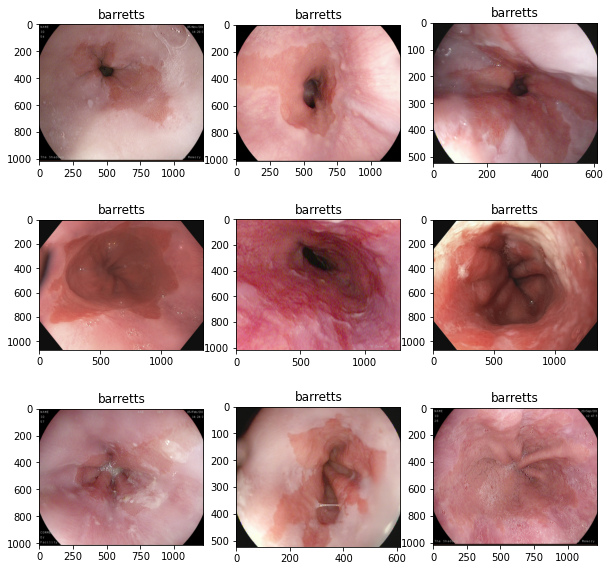

In [9]:
plt.figure(figsize=(10,10))
for i in range(9):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/barretts",Barretsimages[i])),cmap='gray')
    plt.title("barretts")
plt.show()

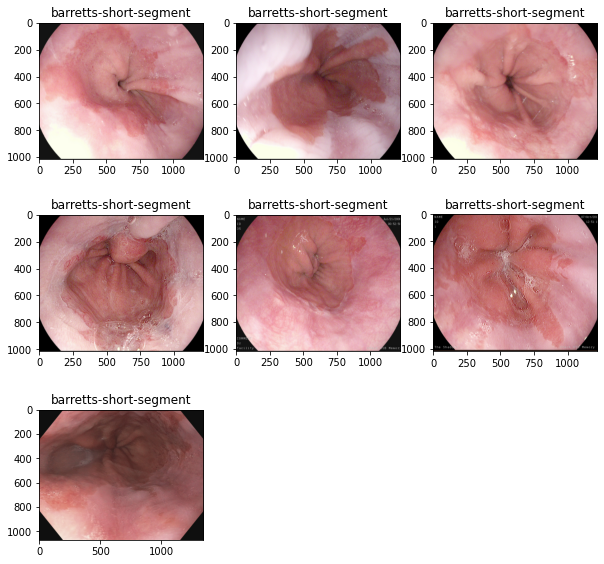

In [10]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/barretts-short-segment",Barretsshortsegmentimages[i])),cmap='gray')
    plt.title("barretts-short-segment")
plt.show()

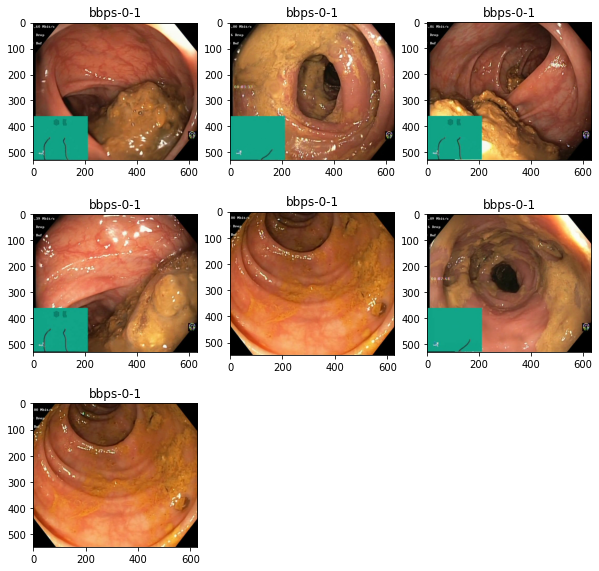

In [11]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/bbps-0-1",bbps01mages[i])),cmap='gray')
    plt.title("bbps-0-1")
plt.show()

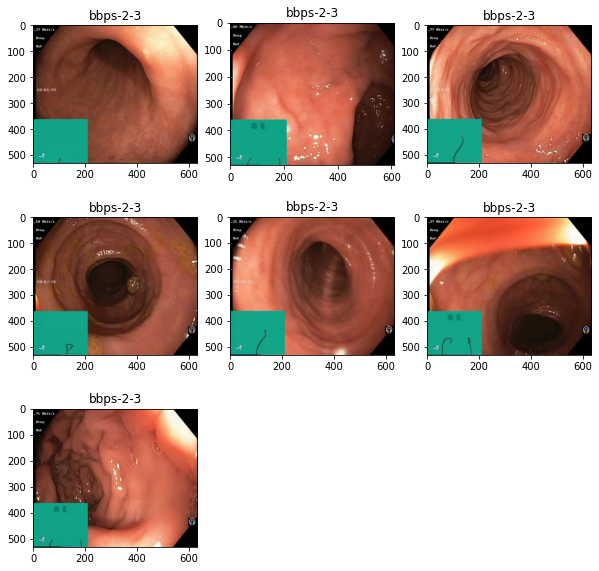

In [12]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/bbps-2-3", bbpa23images[i])),cmap='gray')
    plt.title("bbps-2-3")
plt.show()

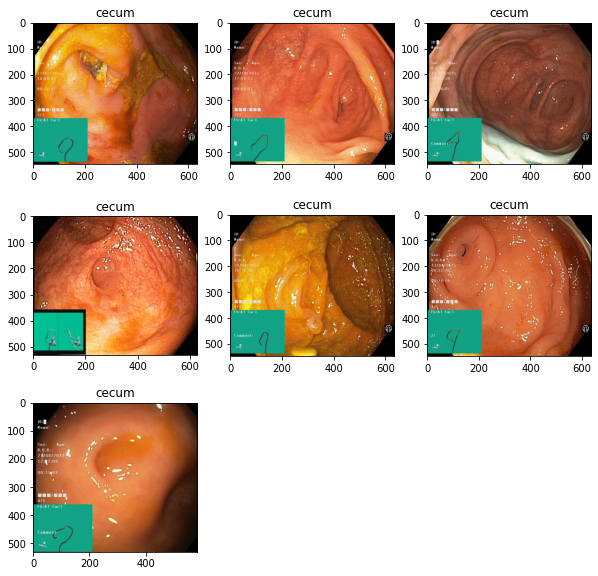

In [13]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/cecum",cecumimages[i])),cmap='gray')
    plt.title("cecum")
plt.show()

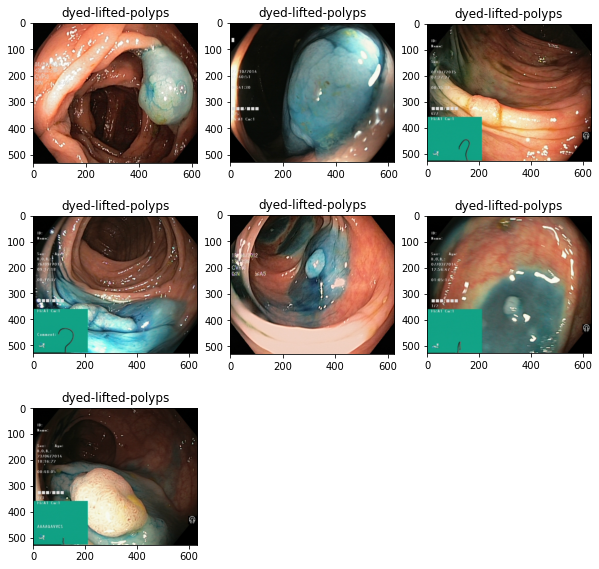

In [14]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/dyed-lifted-polyps",dyedliftedpolypsimages[i])),cmap='gray')
    plt.title("dyed-lifted-polyps")
plt.show()

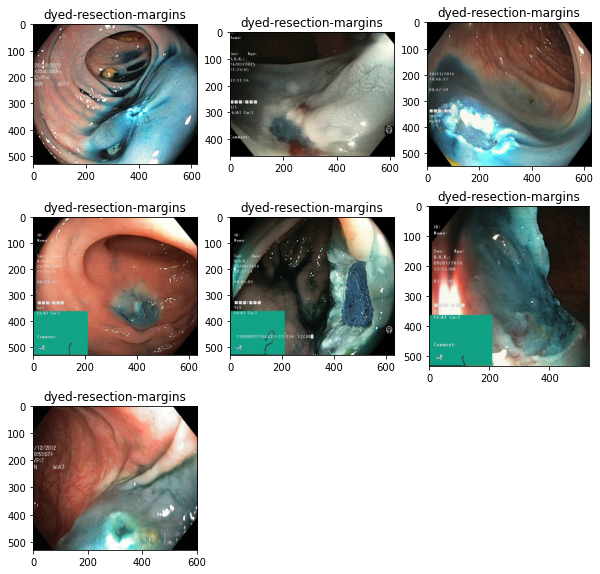

In [15]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/dyed-resection-margins",dyedresectionmarginsimages[i])),cmap='gray')
    plt.title("dyed-resection-margins")
plt.show()

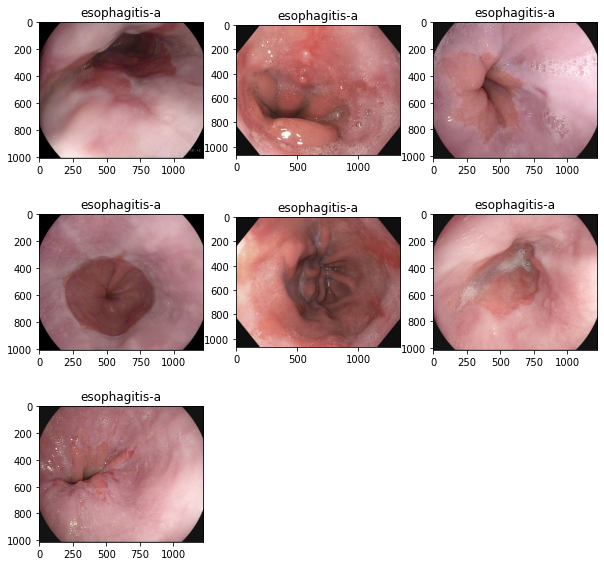

In [16]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/esophagitis-a",esophagatisaimages[i])),cmap='gray')
    plt.title("esophagitis-a")
plt.show()

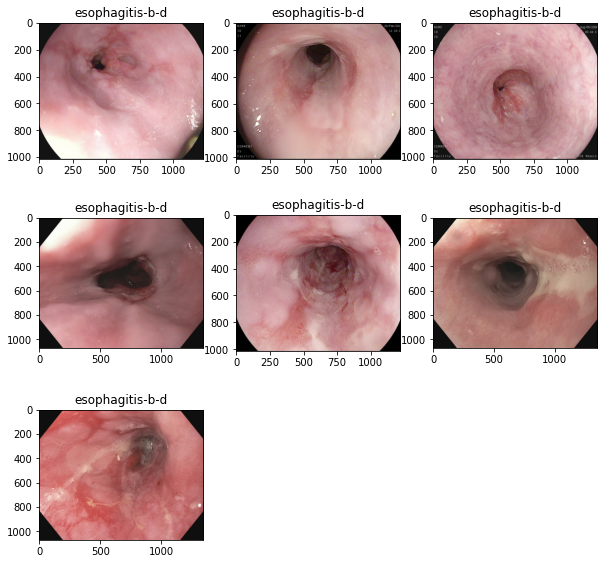

In [17]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/esophagitis-b-d",esophagatisbdimages[i])),cmap='gray')
    plt.title("esophagitis-b-d")
plt.show()

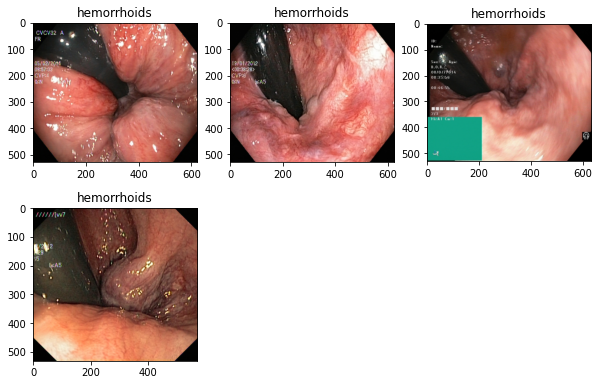

In [18]:
plt.figure(figsize=(10,10))
for i in range(4):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/hemorrhoids", hemorroidsimages[i])),cmap='gray')
    plt.title("hemorrhoids")
plt.show()

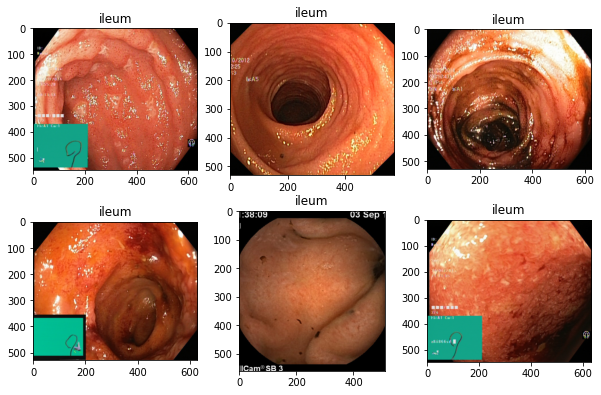

In [19]:
plt.figure(figsize=(10,10))
for i in range(6):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/ileum",ilemimages[i])),cmap='gray')
    plt.title("ileum")
plt.show()

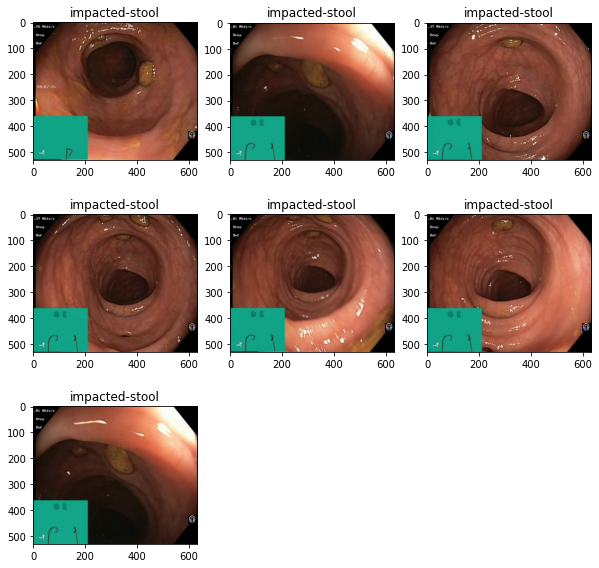

In [20]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/impacted-stool",impactestoolimages[i])),cmap='gray')
    plt.title("impacted-stool")
plt.show()

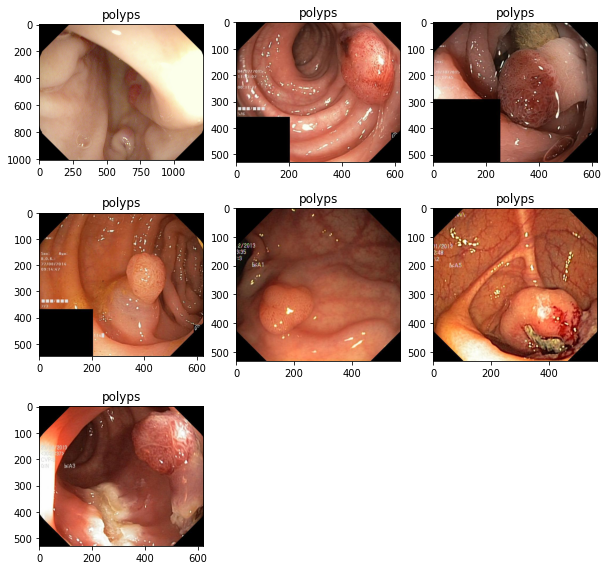

In [21]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/polyps",polypsimages[i])),cmap='gray')
    plt.title("polyps")
plt.show()

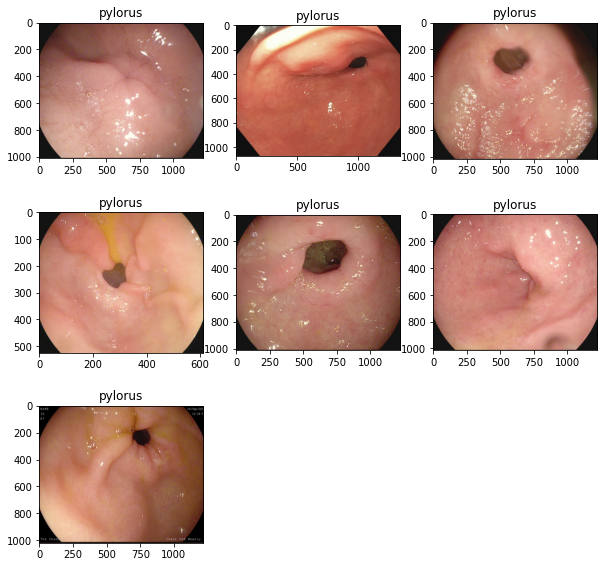

In [22]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/pylorus",pylorusimages[i])),cmap='gray')
    plt.title("pylorus")
plt.show()

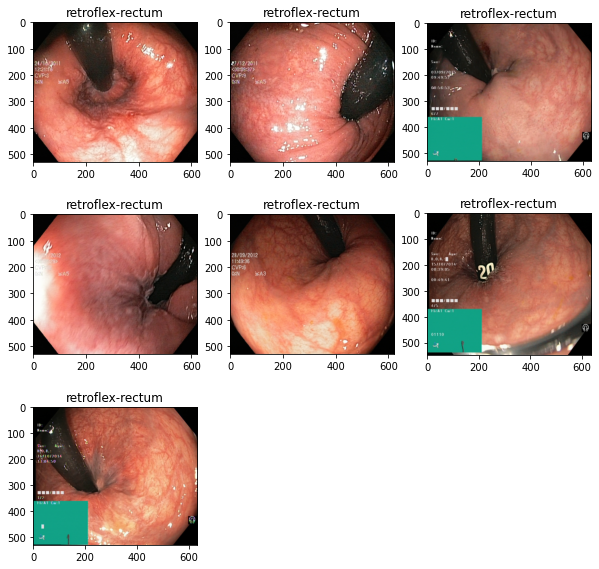

In [23]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/retroflex-rectum",retroflexrectumimages[i])),cmap='gray')
    plt.title("retroflex-rectum")
plt.show()

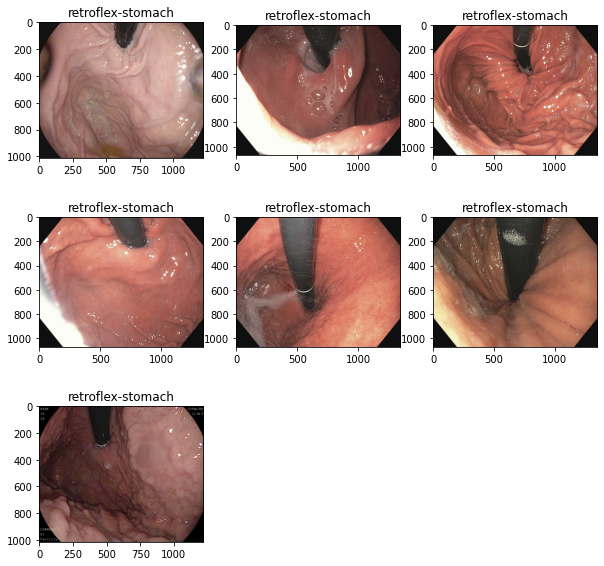

In [24]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/retroflex-stomach",retroflexstomachimages[i])),cmap='gray')
    plt.title("retroflex-stomach")
plt.show()

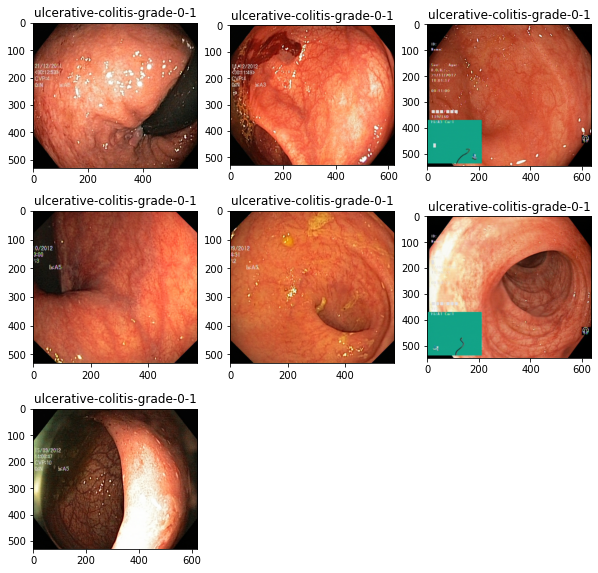

In [25]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/ulcerative-colitis-grade-0-1",ulcerativclitisgrade01images[i])),cmap='gray')
    plt.title("ulcerative-colitis-grade-0-1")
plt.show()

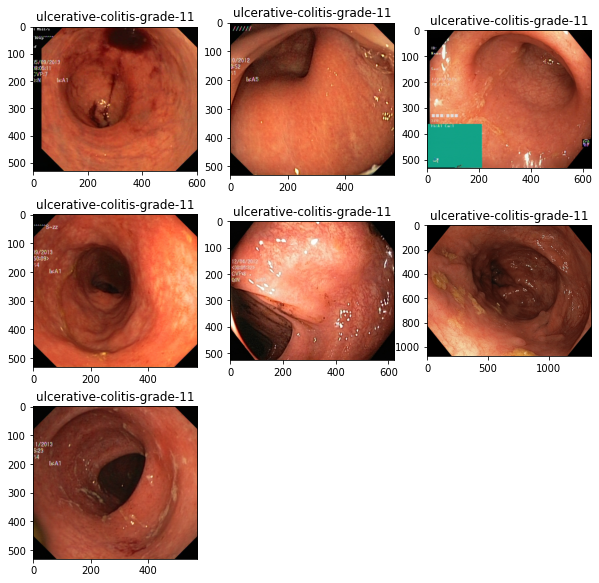

In [26]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/ulcerative-colitis-grade-1",ulcerativclitisgrade1images[i])),cmap='gray')
    plt.title("ulcerative-colitis-grade-11")
plt.show()

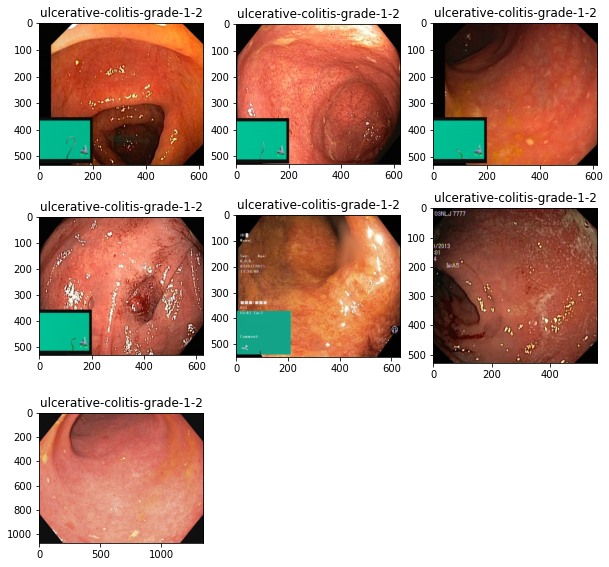

In [27]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/ulcerative-colitis-grade-1-2",ulcerativclitisgrade_12images[i])),cmap='gray')
    plt.title("ulcerative-colitis-grade-1-2")
plt.show()

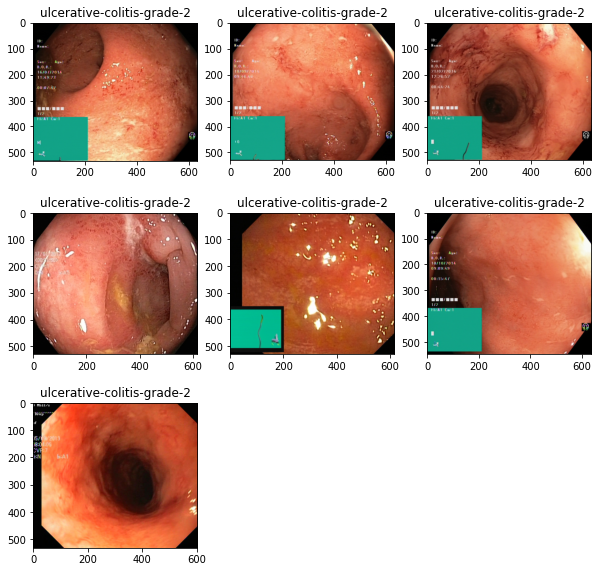

In [28]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/ulcerative-colitis-grade-2",ulcerativclitisgrade2images[i])),cmap='gray')
    plt.title("ulcerative-colitis-grade-2")
plt.show()

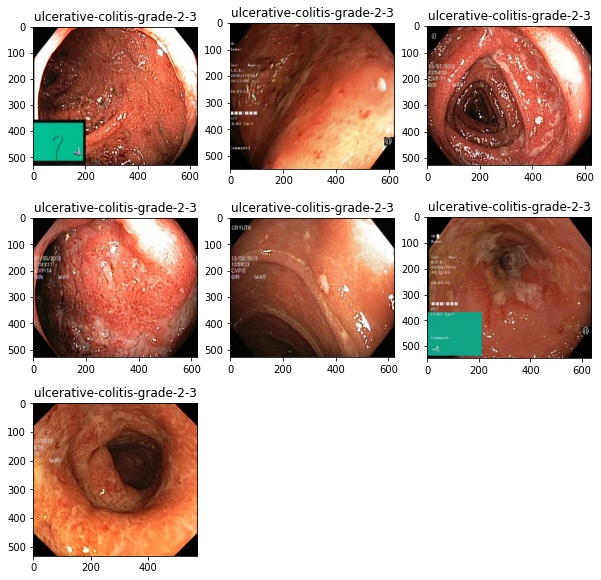

In [29]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/ulcerative-colitis-grade-2-3",ulcerativclitisgrade23images[i])),cmap='gray')
    plt.title("ulcerative-colitis-grade-2-3")
plt.show()

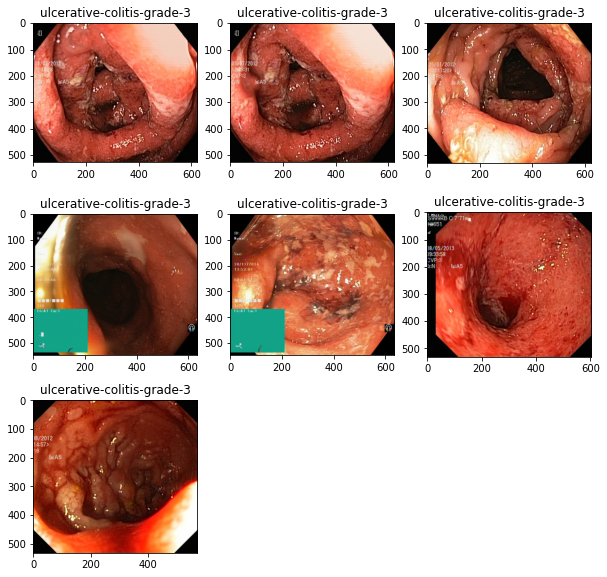

In [30]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/ulcerative-colitis-grade-3",ulcerativclitisgrade3images[i])),cmap='gray')
    plt.title("ulcerative-colitis-grade-3")
plt.show()

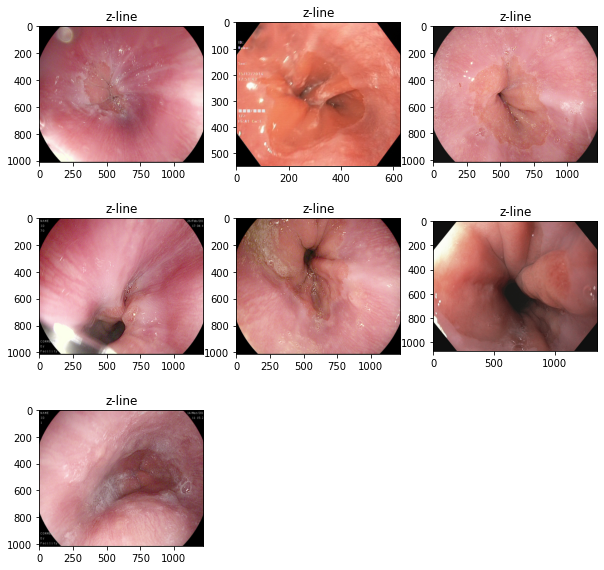

In [31]:
plt.figure(figsize=(10,10))
for i in range(7):
    plt.subplot(3, 3, i + 1)
    plt.imshow(plt.imread(os.path.join(TrianImage + "/z-line",zlineimages[i])),cmap='gray')
    plt.title("z-line")
plt.show()

In [32]:

image_size = 224 
BATCH_SIZE = 64
STEPS_PER_EPOCH = NUM_TRAINING_IMAGES // BATCH_SIZE

data_path = '/content/drive/MyDrive/labeled-images'

train_datagen = ImageDataGenerator(rescale = 1./255,
                                   zoom_range = 0.2,
                                   rotation_range=15,
                                   horizontal_flip = True)

test_datagen = ImageDataGenerator(rescale = 1./255)

training_set = train_datagen.flow_from_directory(data_path + '/Train',
                                                 target_size = (image_size, image_size),
                                                 batch_size = BATCH_SIZE,
                                                 class_mode = 'categorical',
                                                 shuffle=True)

testing_set = test_datagen.flow_from_directory(data_path + '/Test',
                                            target_size = (image_size, image_size),
                                            batch_size = BATCH_SIZE,
                                            class_mode = 'categorical',
                                            shuffle = True)

Found 7470 images belonging to 23 classes.
Found 3211 images belonging to 23 classes.


In [33]:
# https://www.tensorflow.org/api_docs/python/tf/keras/utils/Sequence
print("train batch ", training_set.__getitem__(0)[0].shape)
print("test batch ", testing_set.__getitem__(0)[0].shape)
print("sample train label \n", training_set.__getitem__(0)[1][:5])

train batch  (64, 224, 224, 3)
test batch  (64, 224, 224, 3)
sample train label 
 [[0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]]


In [34]:
training_set.class_indices

{'barretts': 0,
 'barretts-short-segment': 1,
 'bbps-0-1': 2,
 'bbps-2-3': 3,
 'cecum': 4,
 'dyed-lifted-polyps': 5,
 'dyed-resection-margins': 6,
 'esophagitis-a': 7,
 'esophagitis-b-d': 8,
 'hemorrhoids': 9,
 'ileum': 10,
 'impacted-stool': 11,
 'polyps': 12,
 'pylorus': 13,
 'retroflex-rectum': 14,
 'retroflex-stomach': 15,
 'ulcerative-colitis-grade-0-1': 16,
 'ulcerative-colitis-grade-1': 17,
 'ulcerative-colitis-grade-1-2': 18,
 'ulcerative-colitis-grade-2': 19,
 'ulcerative-colitis-grade-2-3': 20,
 'ulcerative-colitis-grade-3': 21,
 'z-line': 22}

In [35]:
testing_set.class_indices

{'barretts': 0,
 'barretts-short-segment': 1,
 'bbps-0-1': 2,
 'bbps-2-3': 3,
 'cecum': 4,
 'dyed-lifted-polyps': 5,
 'dyed-resection-margins': 6,
 'esophagitis-a': 7,
 'esophagitis-b-d': 8,
 'hemorrhoids': 9,
 'ileum': 10,
 'impacted-stool': 11,
 'polyps': 12,
 'pylorus': 13,
 'retroflex-rectum': 14,
 'retroflex-stomach': 15,
 'ulcerative-colitis-grade-0-1': 16,
 'ulcerative-colitis-grade-1': 17,
 'ulcerative-colitis-grade-1-2': 18,
 'ulcerative-colitis-grade-2': 19,
 'ulcerative-colitis-grade-2-3': 20,
 'ulcerative-colitis-grade-3': 21,
 'z-line': 22}

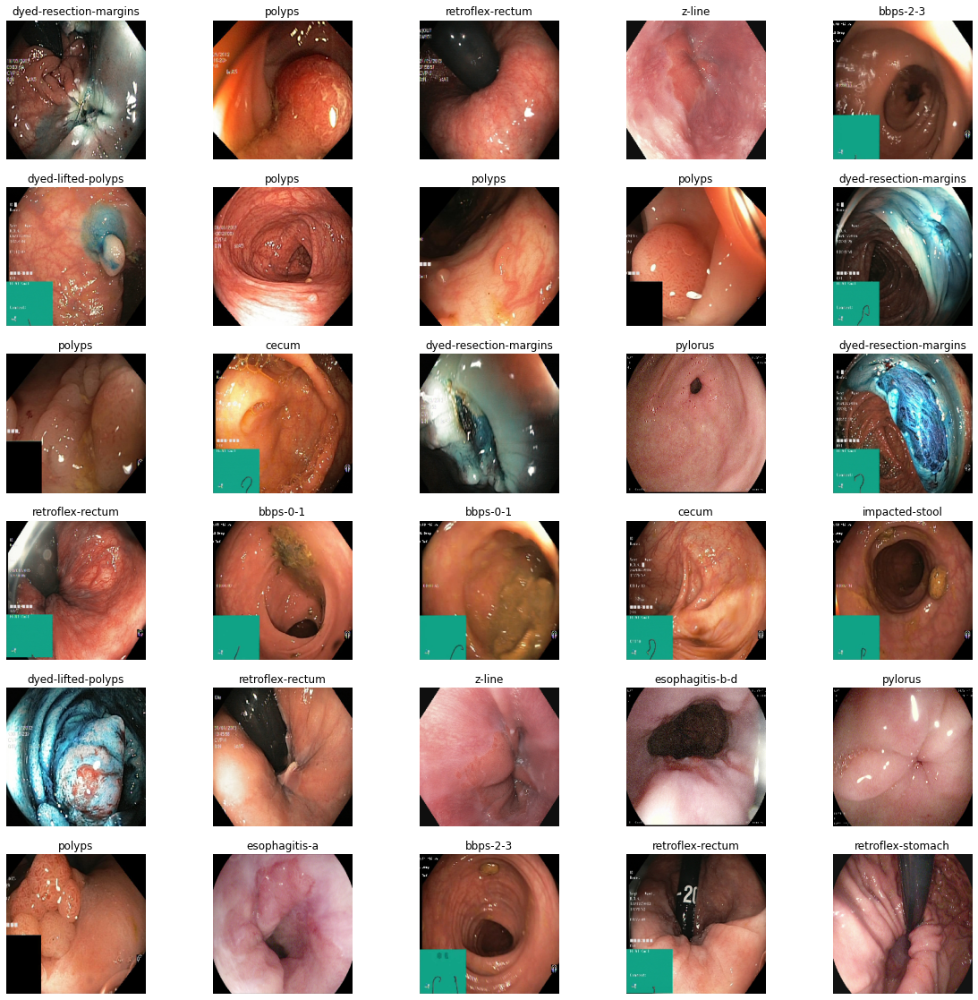

In [36]:
labels = ['barretts', 'barretts-short-segment', 'bbps-0-1', 'bbps-2-3', 'cecum', 'dyed-lifted-polyps', 'dyed-resection-margins', 'esophagitis-a', 'esophagitis-b-d', 'haemorrhoids', 'ileum', 'impacted-stool', 'polyps', 'pylorus', 'retroflex-rectum', 'retroflex-stomach', 'ulcerative-colitis-grade-0-1', 'ulcerative-colitis-grade-1', 'ulcerative-colitis-grade-1-2', 'ulcerative-colitis-grade-2', 'ulcerative-colitis-grade-2-3', 'ulcerative-colitis-grade-3', 'z-line']

sample_data = testing_set.__getitem__(1)[0] 
sample_label = testing_set.__getitem__(1)[1] 

plt.figure(figsize=(20,20))
for i in range(30):
    plt.subplot(6, 5, i + 1)
    plt.axis('off')
    plt.imshow(sample_data[i])
    plt.title(labels[np.argmax(sample_label[i])])

In [37]:
def display_training_curves(training, validation, title, subplot):
    if subplot%10==1: # set up the subplots on the first call
        plt.subplots(figsize=(10,10), facecolor='#F0F0F0')
        plt.tight_layout()
    ax = plt.subplot(subplot)
    ax.set_facecolor('#F8F8F8')
    ax.plot(training)
    ax.plot(validation)
    ax.set_title('model '+ title)
    ax.set_ylabel(title)
    ax.set_xlabel('epoch')
    ax.legend(['train', 'valid.'])

In [38]:
def categorical_smooth_loss(y_true, y_pred, label_smoothing=0.1):
    loss = tf.keras.losses.categorical_crossentropy(y_true, y_pred, label_smoothing=label_smoothing)
    return loss

In [39]:
lr_reduce = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, epsilon=0.0001, patience=3, verbose=1)
es_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1)

In [40]:
counter = Counter(training_set.classes)                          
max_val = float(max(counter.values()))       
class_weights = {class_id : max_val/num_images for class_id, num_images in counter.items()}
class_weights

{0: 27.689655172413794,
 1: 21.7027027027027,
 2: 1.7494553376906319,
 3: 1.0,
 4: 1.1373937677053825,
 5: 1.1438746438746439,
 6: 1.1587301587301588,
 7: 2.8374558303886928,
 8: 4.412087912087912,
 9: 200.75,
 10: 133.83333333333334,
 11: 8.728260869565217,
 12: 1.1168289290681501,
 13: 1.1471428571428572,
 14: 2.9306569343065694,
 15: 1.5009345794392523,
 16: 33.458333333333336,
 17: 5.735714285714286,
 18: 114.71428571428571,
 19: 2.5903225806451613,
 20: 42.26315789473684,
 21: 8.634408602150538,
 22: 1.229709035222052}

**RESNET50V2**

In [41]:
print(tf.keras.applications.ResNet50V2(weights='imagenet').input_shape)

102883328/102869336 [==============================] - 4s 0us/step
(None, 224, 224, 3)


In [42]:
pretrained_resnet = tf.keras.applications.ResNet50V2(input_shape=(image_size, image_size, 3), weights='imagenet', include_top=False)

for layer in pretrained_resnet.layers:
  layer.trainable = False

x3 = pretrained_resnet.output
x3 = tf.keras.layers.AveragePooling2D(name="averagepooling2d_head")(x3)
x3 = tf.keras.layers.Flatten(name="flatten_head")(x3)
x3 = tf.keras.layers.Dense(128, activation="relu", name="dense_head")(x3)
x3 = tf.keras.layers.Dropout(0.5, name="dropout_head")(x3)
x3 = tf.keras.layers.Dense(64, activation="relu", name="dense_head_2")(x3)
x3 = tf.keras.layers.Dropout(0.5, name="dropout_head_2")(x3)
model_out = tf.keras.layers.Dense(23, activation='softmax', name="predictions_head")(x3)

model_resnet = Model(inputs=pretrained_resnet.input, outputs=model_out)
model_resnet.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),loss=categorical_smooth_loss,metrics=['accuracy'])
# model_vgg.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),loss="categorical_crossentropy",metrics=['accuracy'])
model_resnet.summary()

94683136/94668760 [==============================] - 3s 0us/step
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                             

In [43]:
history_resnet = model_resnet.fit_generator(training_set, validation_data=testing_set, callbacks=[lr_reduce, es_callback], epochs=10)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  """Entry point for launching an IPython kernel.


Epoch 1/10
117/117 [==============================] - 9314s 80s/step - loss: 3.1298 - accuracy: 0.1344 - val_loss: 2.4681 - val_accuracy: 0.4397 - lr: 1.0000e-04
Epoch 2/10
117/117 [==============================] - 201s 2s/step - loss: 2.6240 - accuracy: 0.2739 - val_loss: 2.0156 - val_accuracy: 0.5568 - lr: 1.0000e-04
Epoch 3/10
117/117 [==============================] - 198s 2s/step - loss: 2.3750 - accuracy: 0.3636 - val_loss: 1.7509 - val_accuracy: 0.6618 - lr: 1.0000e-04
Epoch 4/10
117/117 [==============================] - 198s 2s/step - loss: 2.2072 - accuracy: 0.4352 - val_loss: 1.5751 - val_accuracy: 0.7069 - lr: 1.0000e-04
Epoch 5/10
117/117 [==============================] - 198s 2s/step - loss: 2.0810 - accuracy: 0.4866 - val_loss: 1.5356 - val_accuracy: 0.7263 - lr: 1.0000e-04
Epoch 6/10
117/117 [==============================] - 197s 2s/step - loss: 2.0064 - accuracy: 0.5229 - val_loss: 1.4756 - val_accuracy: 0.7334 - lr: 1.0000e-04
Epoch 7/10
117/117 [==================

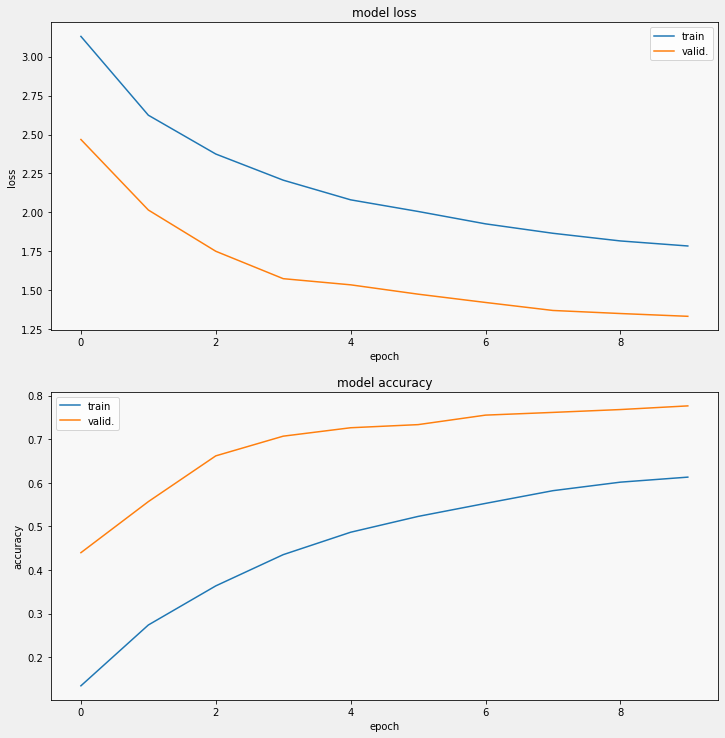

In [44]:
display_training_curves(history_resnet.history['loss'], history_resnet.history['val_loss'], 'loss', 211)
display_training_curves(history_resnet.history['accuracy'], history_resnet.history['val_accuracy'], 'accuracy', 212)

In [45]:
import seaborn as sn

Confusion matrix
[[  0   0   0   0   0   0   0   7   1   0   0   0   0   0   0   0   0   0
    0   0   0   0   5]
 [  0   0   0   0   0   0   0   8   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   8]
 [  0   0 176   8   5   0   0   0   0   0   0   0   4   1   0   0   0   0
    0   0   0   0   0]
 [  0   0   9 335   1   0   0   0   0   0   0   0   0   0   0   0   0   0
    0   0   0   0   0]
 [  0   0   0   0 290   1   1   0   0   0   0   0   8   3   0   0   0   0
    0   0   0   0   0]
 [  0   0   1   1   5 207  69   0   0   0   0   0  17   0   1   0   0   0
    0   0   0   0   0]
 [  0   0   0   0   5  41 244   0   0   0   0   0   5   0   2   0   0   0
    0   0   0   0   0]
 [  0   0   0   0   0   1   0  38   3   0   0   0   0   8   0   0   0   0
    0   0   0   0  71]
 [  0   0   0   0   0   0   0  46  20   0   0   0   0   1   0   0   0   0
    0   0   0   0  11]
 [  0   0   0   0   0   0   1   0   0   0   0   0   0   0   4   1   0   0
    0   0   0   0   0]
 [  0   0   0

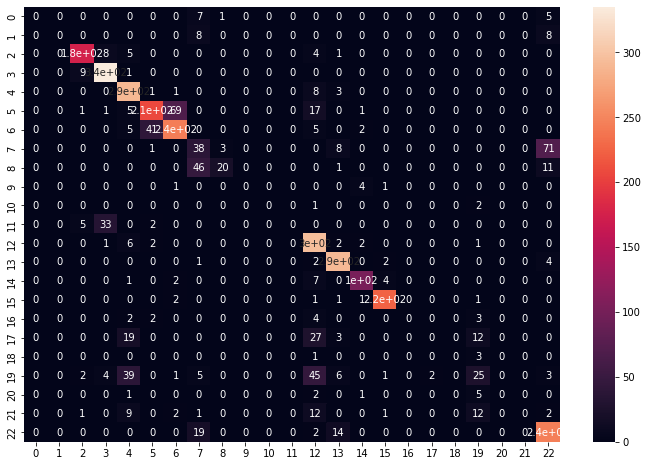

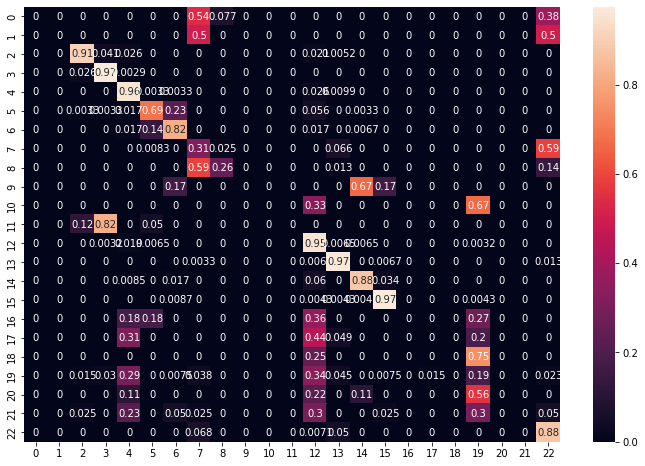

In [46]:
generator = testing_set

batch_index = 0
data_list = []
while batch_index <= generator.batch_index:
    _, label = generator.next()
    data_list.extend(label)
    batch_index = batch_index + 1

gt = np.argmax(data_list, axis=1)

preds = model_resnet.predict(generator)

cm = confusion_matrix(gt, np.argmax(preds, axis=1))
print("Confusion matrix")
print(cm)

# Matriz de confusão normalizada
num_classes = 23
cmn = cm / cm.astype(np.float).sum(axis=1, keepdims=True)
balanced_acc = np.trace(cmn) / num_classes
print("\n\nconfusion matrix balanced")
print(cmn)
print("\n\nBalanced Accuracy:", balanced_acc)
fig, ax = plt.subplots(figsize = (12,8))
sn.heatmap(cm, annot=True)
plt.show()
fig, ax = plt.subplots(figsize = (12,8))
sn.heatmap(cmn, annot=True)
plt.show()


In [47]:
from sklearn.metrics import classification_report

In [48]:
print ('Accuracy:', accuracy_score(gt, np.argmax(preds, axis=1)))
print ('F1 score:', f1_score(gt, np.argmax(preds, axis=1),average='weighted'))
print ('Recall:', recall_score(gt, np.argmax(preds, axis=1),
                              average='weighted'))
print ('Precision:', precision_score(gt, np.argmax(preds, axis=1),
                                    average='weighted'))
print ('\n clasification report:\n', classification_report(gt, np.argmax(preds, axis=1)))
print ('\n confussion matrix:\n',confusion_matrix(gt, np.argmax(preds, axis=1)))

Accuracy: 0.7763936468389909
F1 score: 0.7404487010180885
Recall: 0.7763936468389909
Precision: 0.7251980017497693

 clasification report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.00      0.00      0.00        16
           2       0.91      0.91      0.91       194
           3       0.88      0.97      0.92       345
           4       0.76      0.96      0.85       303
           5       0.81      0.69      0.74       301
           6       0.76      0.82      0.79       297
           7       0.30      0.31      0.31       121
           8       0.83      0.26      0.39        78
           9       0.00      0.00      0.00         6
          10       0.00      0.00      0.00         3
          11       0.00      0.00      0.00        40
          12       0.68      0.95      0.80       309
          13       0.88      0.97      0.92       300
          14       0.90      0.88      0.89      

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: 

In [49]:
#auc = roc_auc_score(gt, np.argmax(preds, axis=1), multi_class="ovr")
#print("auc :", auc)
# Compute ROC curve and ROC area for each class
n_classes = 23
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    y_true = np.array([j[i] for j in data_list[:]])
    y_score = preds[:, i]
    fpr[i], tpr[i], _ = roc_curve(y_true, y_score)
    roc_auc[i] = auc(fpr[i], tpr[i])

# First aggregate all false positive rates
all_fpr = np.unique(np.concatenate([fpr[i] for i in range(n_classes)]))

# Then interpolate all ROC curves at this points
mean_tpr = np.zeros_like(all_fpr)
for i in range(n_classes):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])

# Finally average it and compute AUC
mean_tpr /= n_classes

fpr["macro"] = all_fpr
tpr["macro"] = mean_tpr
roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])

# Compute micro-average ROC curve and ROC area
fpr["micro"], tpr["micro"], _ = roc_curve(np.array([j for j in data_list[:]]).ravel(), preds.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])


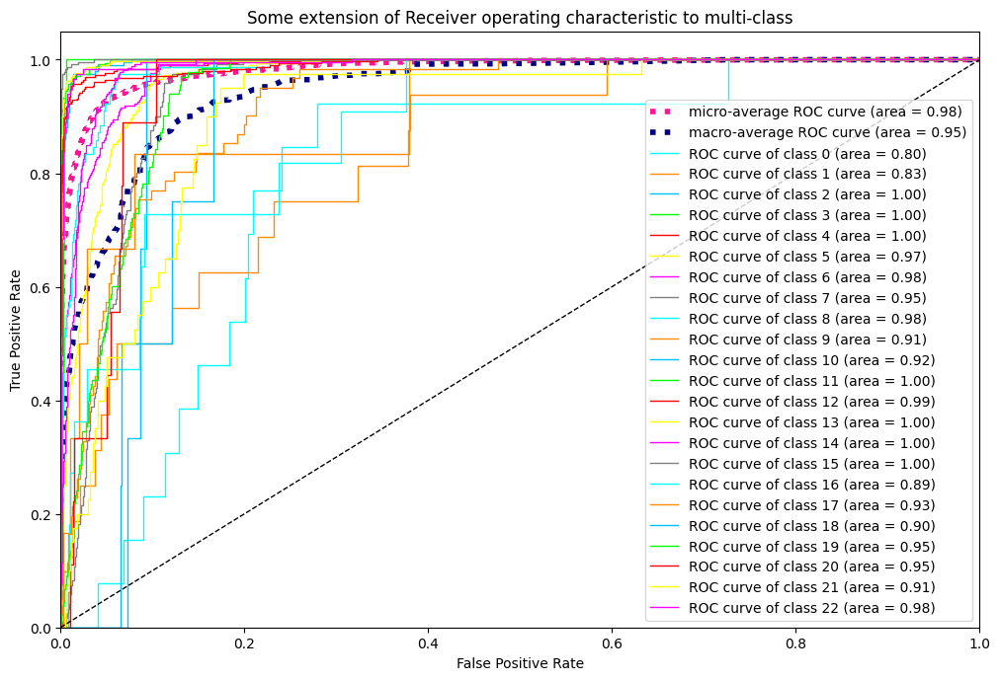

In [50]:
import matplotlib.pyplot as plt
# Plot all ROC curves
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams['figure.dpi'] = 100 
plt.figure()
plt.plot(fpr["micro"], tpr["micro"],
         label='micro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["micro"]),
         color='deeppink', linestyle=':', linewidth=4)

plt.plot(fpr["macro"], tpr["macro"],
         label='macro-average ROC curve (area = {0:0.2f})'
               ''.format(roc_auc["macro"]),
         color='navy', linestyle=':', linewidth=4)

colors = cycle(['aqua', 'darkorange', 'deepskyblue', 'lime', 'red', 'yellow', 'fuchsia', 'gray'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, lw=1,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))

plt.plot([0, 1], [0, 1], 'k--', lw=1)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Some extension of Receiver operating characteristic to multi-class')
plt.legend(loc="lower right")
plt.show()


In [51]:
auc = roc_auc_score(gt, preds, multi_class="ovr")
print("auc :", auc)

auc : 0.9481245719534803


In [54]:
import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Conv2D,Dense,MaxPool2D,Flatten
from tensorflow.keras.regularizers import l2
from tensorflow.keras import regularizers

In [55]:
model_out = tf.keras.layers.Dense(2,  kernel_regularizer=regularizers.l2(0.01),activation='softmax', name="predictions_head")(x3)
model_resnet.compile(optimizer='adam',loss='squared_hinge', metrics = ['accuracy'])

In [56]:
history = model_resnet.fit(x = training_set, validation_data=testing_set, epochs=10)

Epoch 1/10
117/117 [==============================] - 202s 2s/step - loss: 1.0286 - accuracy: 0.5419 - val_loss: 1.0002 - val_accuracy: 0.7303
Epoch 2/10
117/117 [==============================] - 198s 2s/step - loss: 1.0177 - accuracy: 0.6112 - val_loss: 0.9988 - val_accuracy: 0.7378
Epoch 3/10
117/117 [==============================] - 198s 2s/step - loss: 1.0120 - accuracy: 0.6473 - val_loss: 0.9966 - val_accuracy: 0.7484
Epoch 4/10
117/117 [==============================] - 197s 2s/step - loss: 1.0096 - accuracy: 0.6701 - val_loss: 0.9967 - val_accuracy: 0.7515
Epoch 5/10
117/117 [==============================] - 197s 2s/step - loss: 1.0076 - accuracy: 0.6843 - val_loss: 0.9948 - val_accuracy: 0.7680
Epoch 6/10
117/117 [==============================] - 198s 2s/step - loss: 1.0055 - accuracy: 0.6972 - val_loss: 0.9945 - val_accuracy: 0.7661
Epoch 7/10
117/117 [==============================] - 198s 2s/step - loss: 1.0063 - accuracy: 0.6942 - val_loss: 0.9946 - val_accuracy: 0.7783

In [57]:
print ('\n clasification report:\n', classification_report(gt, np.argmax(preds, axis=1)))


 clasification report:
               precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.00      0.00      0.00        16
           2       0.91      0.91      0.91       194
           3       0.88      0.97      0.92       345
           4       0.76      0.96      0.85       303
           5       0.81      0.69      0.74       301
           6       0.76      0.82      0.79       297
           7       0.30      0.31      0.31       121
           8       0.83      0.26      0.39        78
           9       0.00      0.00      0.00         6
          10       0.00      0.00      0.00         3
          11       0.00      0.00      0.00        40
          12       0.68      0.95      0.80       309
          13       0.88      0.97      0.92       300
          14       0.90      0.88      0.89       117
          15       0.96      0.97      0.97       230
          16       0.00      0.00      0.00        11
  

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1308: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
